# FM1 - Special Analysis & Figures for IAC 2024 Keystone Paper
Performs special analysis and figure creation for Keystone paper (beyond just plotting telem for time ranges)

In [1]:
# TODO: Wh est. from lander, from battery, to heater across mission, shared w/ Power
# TODO: Tdot plots
# TODO: TRL table.

In [2]:
TITLE: str = "Iris Lunar Rover - FM1 - Full Mission"
FILES_TITLE: str = "fm1_full_mission"

In [3]:
from datetime import datetime, timezone, timedelta
# Some useful milestone times:
MOTOR_START_TIME = datetime(2024, 1, 15, hour=4, minute=52, tzinfo=timezone.utc)
MOTOR_END_TIME = datetime(2024, 1, 15, hour=5, minute=25, tzinfo=timezone.utc)
OP1_START_TIME = datetime(2024, 1, 9, hour=13, minute=50, tzinfo=timezone.utc)
OP1_END_TIME = datetime(2024, 1, 9, hour=16, minute=00, tzinfo=timezone.utc)
OP2_START_TIME = datetime(2024, 1, 14, hour=23, minute=15, tzinfo=timezone.utc)
OP2_END_TIME = datetime(2024, 1, 15, hour=5, minute=45, tzinfo=timezone.utc)
# Time range to plot:
START_TIME = None  # datetime(2024, 1, 15, hour=4, minute=52, tzinfo=timezone.utc)
# Time of second photo:
END_TIME = None  # datetime(2024, 1, 15, hour=5, minute=25, tzinfo=timezone.utc)
START_TIME, END_TIME

(None, None)

In [4]:
import numpy as np 
import pandas as pd

from typing import Any, Tuple, List, Dict, Iterable, Callable

In [5]:
from IrisBackendv3.storage.dataset import DataSet
from scripts.utils.plotting_tools import *
from scripts.utils.fm1_plot_formatting import *

In [6]:
# Load Data Archive:
full_telem_archive = DataSet.load_from_parquet('./out/fm1_data/yamcs_export/fm1_mission_archive.telem.parquet')
telem_full = full_telem_archive.data
telem_full.shape

(232684, 274)

In [7]:
# List out all columns we care about across all categories we care about:
# Key is telemetry channel name, value is key to use in legend:
data = RoverPlotData(
    telem_full,
    # let all categorical tables keep all rows for cross compare:
    drop_na_rows=False,
    # don't automatically drop any rows for time (so full mission available):
    start_time=None,
    end_time=None,
    # Override certain column categories:
    thermal_cols = {
        'MetaModTemps_BoardTherm0_RT1Kelvin': 'SBC-RT1',
        'MetaModTemps_BoardTherm1_RT2Kelvin': 'SBC-RT2',
        'MetaModTemps_BoardTherm2_RT3Kelvin': 'SBC-RT3',
        'MetaModTemps_BoardTherm3_RT4Kelvin': 'SBC-RT4',
        'MetaModTemps_BoardTherm4_RT5Kelvin': 'SBC-RT5',
        'MetaModTemps_BoardTherm5_RT6Kelvin': 'SBC-RT6',
        'MetaModTemps_RoverTherm6_TMR1Kelvin': 'TMR1',
        'MetaModTemps_RoverTherm7_TMR2Kelvin': 'TMR2',
        'MetaModTemps_RoverTherm8_TMR3Kelvin': 'TMR3',
        'MetaModTemps_RoverTherm9_TMR4Kelvin': 'TMR4',
        'MetaModTemps_RoverTherm10_TMR5Kelvin': 'TMR5',
        'MetaModTemps_RoverTherm11_TMR6Kelvin': 'TMR6',
        'MetaModTemps_RoverTherm12_TMR7Kelvin': 'TMR7',
        'MetaModTemps_RoverTherm13_TMR8Kelvin': 'TMR8',
        'MetaModTemps_RoverTherm14_TMR9Kelvin': 'TMR9',
        'MetaModTemps_RoverTherm15_TMR10Kelvin': 'TMR10',
        'MetaModTemps_BatteryTempAvgKelvin': 'Battery (Avg.)',
        'MetaModPeregrine_DeckD2TempKelvin': 'Lander Deck (D2)',
        'WatchdogDetailedStatus_Heater_OffTempKelvin': 'Heater OFF Thresh.',
        'WatchdogDetailedStatus_Heater_OnTempKelvin': 'Heater ON Thresh.'
    },
    current_cols = {
        'MetaModPeregrine_OperationalCorrectedCurrentAvg_mA': 'From Lander (Avg)',
        'MetaModRoverPower_FullSystemCurrent_mA': 'Full-System (VSA)',
        'MetaModRoverPower_MotorBusCurrent_mA': 'Motors (24V)',
        'MetaModRoverPower_Full3V3Current_mA': '3V3',
        'MetaModRoverPower_Fpga3V3Current_mA': '3V3F',
        'MetaModRoverPower_Fpga1V2Current_mA': '1V2F',
        'MetaModRoverPower_Hercules3V3Current_mA': '3V3H',
        'MetaModRoverPower_Hercules1V2Current_mA': '1V2H',
        'MetaModRoverPower_Radio3V3Current_mA': '3V3R'
    },
    power_cols = {
        'MetaModTransitPower_HeaterPowerLive_W': 'Heater',
        'WatchdogDetailedStatus_Heater_EffectivePowerLimit': 'Heater (Limit)',
        'MetaModPeregrine_OperationalPowerAvg_W': 'From Lander (Avg)',
        # 'MetaModPeregrine_OperationalPowerMax_W': 'From Lander (Max)',
        'MetaModRoverPower_FullSystemPowerEst_W': 'Full-System (VSA)',
        'MetaModRoverPower_MotorPowerEst_W': 'Motors (24V)',
        'MetaModRoverPower_Power3V3Est_W': '3V3'
    }
)

## Thermals Data

In [66]:
# Temperature Range:
temps = data.thermal.copy(deep=True)
drop_cols = ['Heater OFF Thresh.', 'Heater ON Thresh.']
drop_cols = [dc for dc in drop_cols if dc in temps.columns]
temps = temps.drop(columns=drop_cols, inplace=False)

# Drop faulty sensors:
temps = temps.drop(columns=['TMR2'])

# Prune temps that are out of sensor bounds:
temps[temps < (-54.5+273.15)] = np.nan
temps[temps > (150+273.15)] = np.nan

# Clean data (remove blips):
temp_mins = temps.copy(deep=True)
temp_maxs = temps.copy(deep=True)
for c in temps.columns:
    temp_mins[c] = temps[c].rolling(timedelta(minutes=1), min_periods=2).max()
    temp_maxs[c] = temps[c].rolling(timedelta(minutes=1), min_periods=2).min()
    
temps = temps.dropna(axis=0, how='all', inplace=False)
temp_mins = temp_mins.dropna(axis=0, how='all', inplace=False)
temp_maxs = temp_maxs.dropna(axis=0, how='all', inplace=False)

rover_drop_cols = [c for c in ['Lander Deck (D2)'] if c in temps.columns]
rover_temps = temps.drop(columns=rover_drop_cols)
rover_temps = rover_temps.dropna(axis=0, how='all', inplace=False)

res_cols = ["Component(s)", "Min. [°C]", "Mean [°C]", "Max [°C]"]
results = pd.DataFrame(columns=res_cols)
for cols, sensors, components in [
    (['SBC-RT1', 'SBC-RT2', 'SBC-RT3', 'SBC-RT4', 'SBC-RT5', 'SBC-RT6', 'TMR4'], "RT\{1-6\}, TMR4", "SBC"),
    (['SBC-RT5'], "RT5", "Watchdog"),
    (['TMR4', 'SBC-RT2'], "TMR4, RT2", "Hercules"),
    (['SBC-RT1'], "RT1", "Radio"),
    (['SBC-RT3'], "RT3", "Motor Driver A (used)"),
    (['TMR5', 'TMR6', 'TMR7', 'TMR9'], "TMR\{5,6,7,9\}", "All Motors (1-4)"),
    (['TMR8', 'TMR10'], "TMR\{8,10\}", "All Cameras (1-2)"),
    (['Battery (Avg.)'], "TMR\{1,3\}, WD", "Battery Pack (Avg.)"),
    (['Lander Deck (D2)'], "Deck D2", "Lander Deck (D2)"),
    ([*rover_temps.columns], "All", "Rover"),
]:
    cols = [c for c in cols if c in temps.columns]
    results = pd.concat((
        results,
        pd.DataFrame([(
            components,
            f"{(x:=temp_mins[cols].min().min()-273.15):.1f}°C",
            f"{(x:=temps[cols].mean().mean()-273.15):.1f}°C",
            f"{(x:=temp_maxs[cols].max().max()-273.15):.1f}°C"
        )], index=[sensors], columns=res_cols)
    ))
results.index.name = "Sensor(s)"
results

,Component(s),Min. [°C],Mean [°C],Max [°C]
Sensor(s),,,,
"RT\{1-6\}, TMR4",SBC,-1.2°C,16.4°C,26.3°C
RT5,Watchdog,6.6°C,20.9°C,26.3°C
"TMR4, RT2",Hercules,-1.2°C,13.1°C,21.6°C
RT1,Radio,13.9°C,22.8°C,25.9°C
RT3,Motor Driver A (used),0.1°C,14.5°C,19.8°C
"TMR\{5,6,7,9\}",All Motors (1-4),-31.2°C,1.1°C,20.3°C
"TMR\{8,10\}",All Cameras (1-2),-45.0°C,-22.9°C,1.8°C
"TMR\{1,3\}, WD",Battery Pack (Avg.),-12.7°C,8.6°C,28.4°C
Deck D2,Lander Deck (D2),-24.9°C,24.6°C,46.4°C


In [55]:
print("""
    RT\{1-6\}, TMR4	& SBC	                & -1.2°C    & 16.4°C	& 26.3°C \\
    RT5	            & Watchdog	            & 6.6°C     & 20.9°C	& 26.3°C \\
    TMR4, RT2	    & Hercules	            & -1.2°C    & 13.1°C    & 21.6°C \\
    RT1	            & Radio	                & 13.9°C    & 22.8°C	& 25.9°C \\
    RT3	            & Motor Driver A (used)	& 0.1°C	    & 14.5°C	& 19.8°C \\
    TMR\{5,6,7,9\}	& All Motors (1-4)	    & -31.2°C	& 1.1°C     & 20.3°C \\
    TMR\{8,10\}	    & All Cameras (1-2)	    & -45.0°C	& -22.9°C	& 1.8°C \\
    TMR\{1,3\}, WD  & Battery Pack (Avg.)	& -12.7°C	& 8.6°C     & 28.4°C \\
    Deck D2         & Lander Deck (D2)	    & -24.9°C	& 24.6°C    & 46.4°C \\
    All	            & Rover	                & -45.0°C   & 4.4°C     & 28.4°C \\
""")


    RT\{1-6\}, TMR4	& SBC	                & -1.2°C    & 16.4°C	& 26.3°C \
    RT5	            & Watchdog	            & 6.6°C     & 20.9°C	& 26.3°C \
    TMR4, RT2	    & Hercules	            & -1.2°C    & 13.1°C    & 21.6°C \
    RT1	            & Radio	                & 13.9°C    & 22.8°C	& 25.9°C \
    RT3	            & Motor Driver A (used)	& 0.1°C	    & 14.5°C	& 19.8°C \
    TMR\{5,6,7,9\}	& All Motors (1-4)	    & -31.2°C	& 1.1°C     & 20.3°C \
    TMR\{8,10\}	    & All Cameras (1-2)	    & -45.0°C	& -22.9°C	& 1.8°C \
    TMR\{1,3\}, WD  & Battery Pack (Avg.)	& -12.7°C	& 8.6°C     & 28.4°C \
    Deck D2         & Lander Deck (D2)	    & -24.9°C	& 24.6°C    & 46.4°C \
    All	            & Rover	                & -45.0°C   & 4.4°C     & 28.4°C \



In [53]:
# nantrapz
# Credit: Jason Leaver, https://stackoverflow.com/questions/78065013/skip-nan-values-when-integrating-using-numpy-trapz
from __future__ import annotations


from typing import SupportsIndex

import numpy as np
from numpy._typing._array_like import _ArrayLikeComplex_co, _ArrayLikeTD64_co, _ArrayLikeObject_co


def nantrapz(
    y: _ArrayLikeComplex_co | _ArrayLikeTD64_co | _ArrayLikeObject_co,
    x: _ArrayLikeComplex_co | _ArrayLikeTD64_co | _ArrayLikeObject_co | None = None,
    dx: float = 1.0,
    axis: SupportsIndex = -1,
):
    y = np.asanyarray(y)
    if x is None:
        d = dx
    else:
        x = np.asanyarray(x)
        if x.ndim == 1:
            d = np.diff(x)
            # reshape to correct shape
            shape = [1] * y.ndim
            shape[axis] = d.shape[0]
            d = d.reshape(shape)
        else:
            d = np.diff(x, axis=axis)
    nd = y.ndim
    slice1 = [slice(None)] * nd
    slice2 = [slice(None)] * nd
    slice1[axis] = slice(1, None)
    slice2[axis] = slice(None, -1)
    try:
        ret = np.nansum(d * (y[tuple(slice1)] + y[tuple(slice2)]) / 2.0, axis=axis)
    except ValueError:
        # Operations didn't work, cast to ndarray
        d = np.asarray(d)
        y = np.asarray(y)
        ret = np.add.reduce(d * (y[tuple(slice1)] + y[tuple(slice2)]) / 2.0, axis)
    return ret

(1.386887723826146, 1.3872014518703193, 1.4058778577731657)

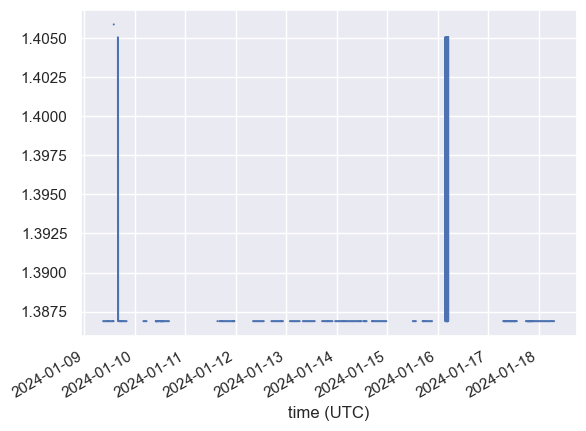

In [145]:
# Heater Power:
hs = data.power['Heater']
hs = hs.where(hs>1)
hs.plot()
hs.rolling(timedelta(minutes=1)).max().min(), hs.mean(), hs.rolling(timedelta(minutes=1)).min().max()

<Axes: xlabel='time (UTC)'>

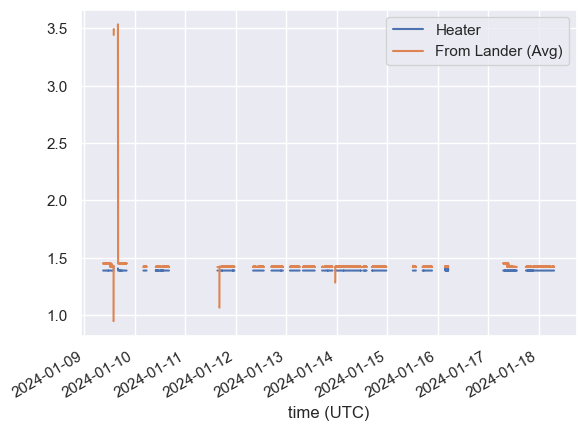

In [71]:
hps = data.power[['Heater', 'From Lander (Avg)']]
hs = data.power['Heater']
valid = (hs>1) & (hs.notna())
hps = hps.where(valid)
hps.plot()

Text(0.5, 1.0, 'Heater Power Ratio during KeepAlive')

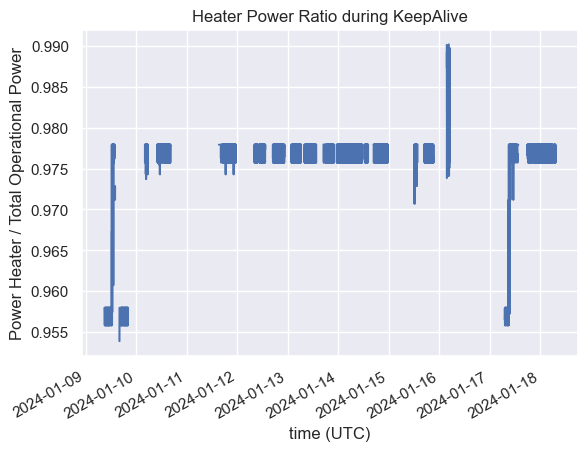

In [65]:
# Keep-Alive Resting Heater Power Ratio
hs = data.power['Heater']
valid = (hs>1) & (hs.notna())
hs = hs.where(valid)
ps = data.power['From Lander (Avg)']
ps = ps.where(valid)
rs = (hs/ps)
rs = rs.where((rs < 1) & (rs>0.8))
rs.plot()
rs.min(), rs.mean(), rs.max()
plt.ylabel("Power Heater / Total Operational Power")
plt.title("Heater Power Ratio during KeepAlive")

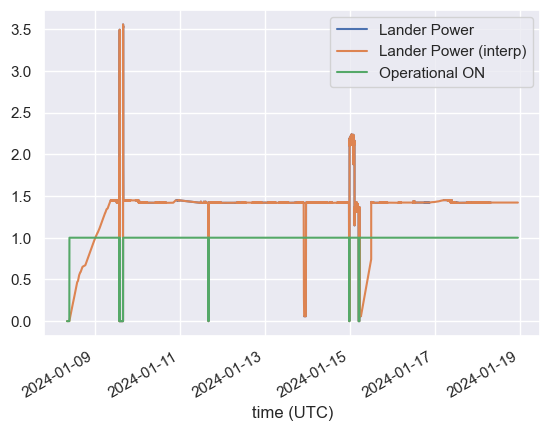

In [77]:
# Forward-filled lander power:
# Grab raw data:
time_range = (
    (data.telem_full.index == data.telem_full.index)
    # & (data.telem_full.index >= OP2_START_TIME)
    # & (data.telem_full.index <= OP2_END_TIME)
)
states = data.states[time_range]
power = data.power[time_range]
circuit_on = states['Operational Circuit'].ffill() == "ENABLED"
ps = power['From Lander (Avg)']
ps = ps.where(circuit_on, 0)
# Fill out for missing timestamps:
ps = ps.interpolate(method='linear', inplace=False)
ps = ps.where(circuit_on, 0)
# Only keep data where circuit was last reported as on:
power['From Lander (Avg)'].plot(label='Lander Power')
ps.plot(label='Lander Power (interp)')
circuit_on.astype(int).plot(label='Operational ON')
plt.legend()

336.2318124832711

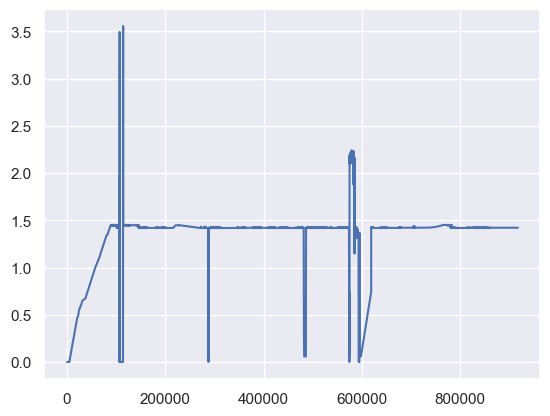

In [79]:
# Total Lander Energy Supply:
# Forward-filled lander power:
# Grab raw data:
time_range = (
    (data.telem_full.index == data.telem_full.index)
    # & (data.telem_full.index >= OP2_START_TIME)
    # & (data.telem_full.index <= OP2_END_TIME)
)
states = data.states[time_range]
power = data.power[time_range]
circuit_on = states['Operational Circuit'].ffill() == "ENABLED"
ps = power['From Lander (Avg)']
ps = ps.where(circuit_on, 0)
# Fill out for missing timestamps:
ps = ps.interpolate(method='linear', inplace=False)
ps = ps.where(circuit_on, 0)

# Integrate:
t_curve = (ps.index - ps.index[0]).total_seconds().to_numpy()
p_curve = ps.to_numpy()
plt.plot(t_curve, p_curve)
nantrapz(p_curve, t_curve)/60/60

325.8489153193395


<Axes: xlabel='time (UTC)'>

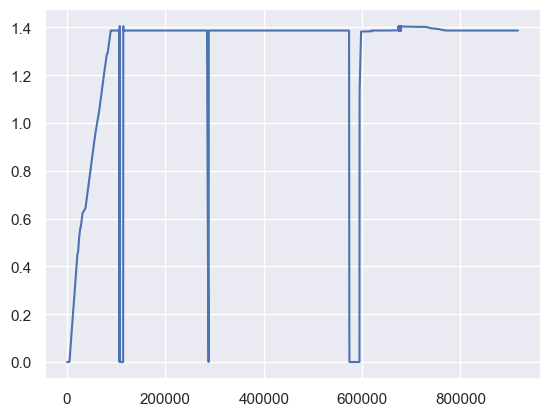

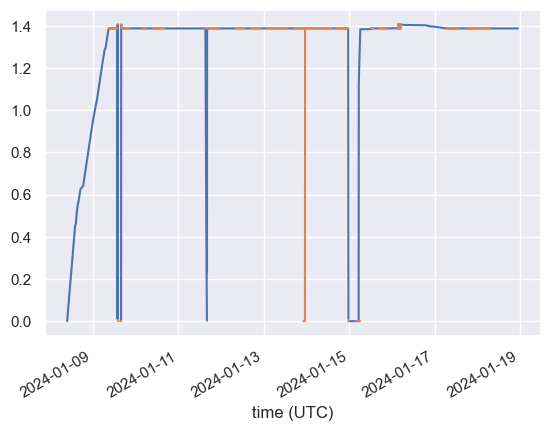

In [83]:
# Heater Energy Consumption
# NOTE: This is tricky b/c the WD isn't always telemetering, even when the
# circuit is on.
# - Operational Circuit is On
# - Live "Heater" power is > 0 (heater is on) or nan (in which case we're going to assume heater is on if power is being supplied)

# Forward-filled lander power:
# Grab raw data:
time_range = (
    (data.telem_full.index == data.telem_full.index)
    # & (data.telem_full.index >= OP2_START_TIME)
    # & (data.telem_full.index <= OP2_END_TIME)
)
states = data.states[time_range]
power = data.power[time_range]
circuit_on = states['Operational Circuit'].ffill() == "ENABLED"
ps = power['From Lander (Avg)']
ps = ps.where(circuit_on, 0)
hs = power['Heater']
hs = hs.where(hs > 1).where(circuit_on, 0)
# Fill out for missing timestamps:
ps = ps.interpolate(method='linear', inplace=False)
hs = hs.interpolate(method='linear', inplace=False)
# Ensure only logging power when circuit is on:
ps = ps.where(circuit_on, 0)
hs = hs.where(circuit_on, 0)

# Integrate:
t_curve = (hs.index - hs.index[0]).total_seconds().to_numpy()
h_curve = hs.to_numpy()
plt.plot(t_curve, h_curve)
print(nantrapz(h_curve, t_curve)/60/60)

plt.figure()
hs.where(circuit_on).plot()
data.power['Heater'].plot()

Mission Span:  10 days 14:43:57.041000 254.733hr
Operational Span:  10 days 14:43:57.041000 254.733hr
Max. Operational Time:  10 days 10:53:58.234000 250.900hr
Max. Heater Time:  9 days 13:02:58.713000 229.050hr


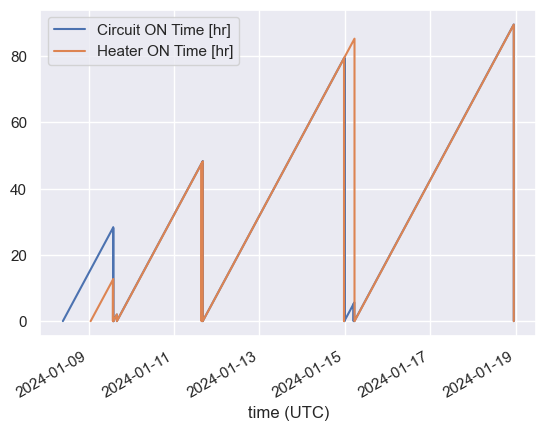

In [87]:
# Heater On-Time:
from scripts.utils.plotting_tools import _get_run_lengths, _get_run_lengths_series_seconds
circuit_on = data.states['Operational Circuit'].ffill() == "ENABLED"
hs = data.power['Heater']
hs = hs.where(hs > 1).where(circuit_on, 0)
hs = hs.interpolate(method='linear', inplace=False)
hs = hs.where(circuit_on, 0)
is_heating = (hs > 1) & circuit_on

dt = data.telem_full.index.max() - data.telem_full.index.min()
print("Mission Span: ", dt, f"{dt.total_seconds()/60/60:.3f}hr")
dt = circuit_on.dropna().index.max()-circuit_on.dropna().index.min()
print("Operational Span: ", dt, f"{dt.total_seconds()/60/60:.3f}hr")
dt = sum(_get_run_lengths(circuit_on), timedelta(seconds=0))
print("Max. Operational Time: ", dt, f"{dt.total_seconds()/60/60:.3f}hr")
dt = sum(_get_run_lengths(is_heating), timedelta(seconds=0))
print("Max. Heater Time: ", dt, f"{dt.total_seconds()/60/60:.3f}hr")

(_get_run_lengths_series_seconds(circuit_on)/60/60).plot(label='Circuit ON Time [hr]')
(_get_run_lengths_series_seconds(is_heating)/60/60).plot(label='Heater ON Time [hr]')
plt.legend()

(29.615199964743592, 29.78043672490139, 29.804011283790445)

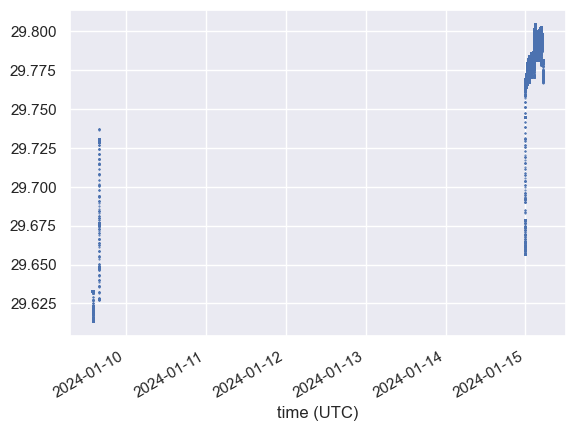

In [140]:
# Operational Lander Voltage Range:
time_range = (
    (data.telem_full.index == data.telem_full.index)
    # & (data.telem_full.index >= (OP1_END_TIME-timedelta(minutes=15)))
    # & (data.telem_full.index <= (OP1_END_TIME-timedelta(minutes=9)))
)
states = data.states[time_range]
volts = data.voltages[time_range]
circuit_on = states['Operational Circuit'].ffill() == "ENABLED"
VLs = volts['Lander (28V)']
VLs = VLs.where(circuit_on)
VLs = VLs.rolling(timedelta(minutes=1), min_periods=200).max()
VLs.plot(marker='.', markersize=1, linestyle='none')
VLs.rolling(timedelta(minutes=1)).max().min(), VLs.mean(), VLs.rolling(timedelta(minutes=1)).min().max()

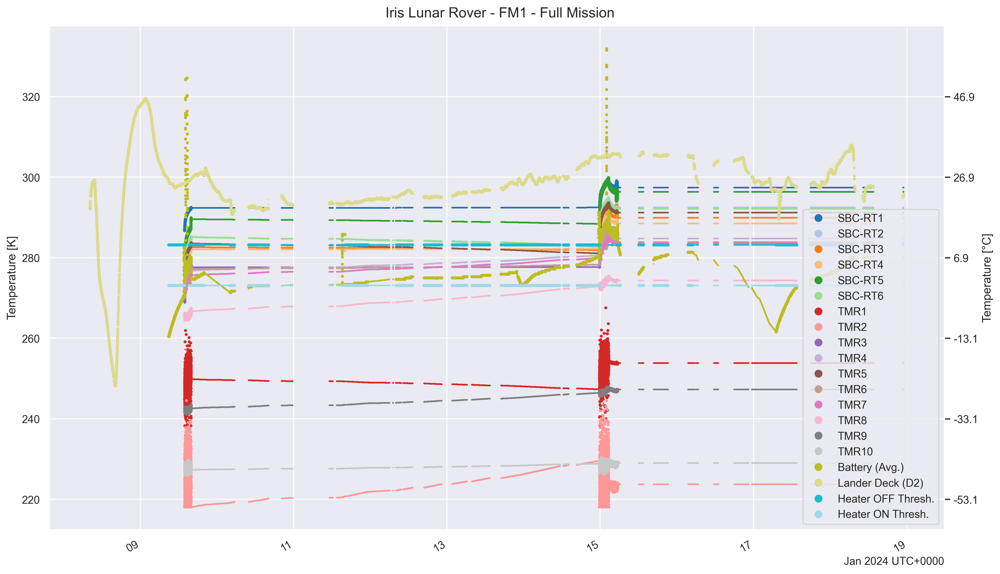

In [8]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_thermal(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Power Data

In [16]:
data.power = data_power_og

In [17]:
data_power_og = data.power.copy(deep=True)
data.power = data.power[
    (data.power.index >= datetime(2024, 1, 15, hour=4, minute=54, tzinfo=timezone.utc))
    & (data.power.index <= datetime(2024, 1, 15, hour=4, minute=58, tzinfo=timezone.utc))
]

In [18]:
data.power.dropna(axis=0, how='all', inplace=False).head(3)

,Heater,Heater (Limit),From Lander (Avg),Motors (24V),3V3
time (UTC),,,,,
2024-01-15 04:54:00.437000+00:00,NaN,NaN,1.361553,0.001441,0.815160
2024-01-15 04:54:01.428000+00:00,NaN,NaN,1.361436,0.001441,0.823138
2024-01-15 04:54:01.553000+00:00,NaN,NaN,1.361845,0.001441,0.823138


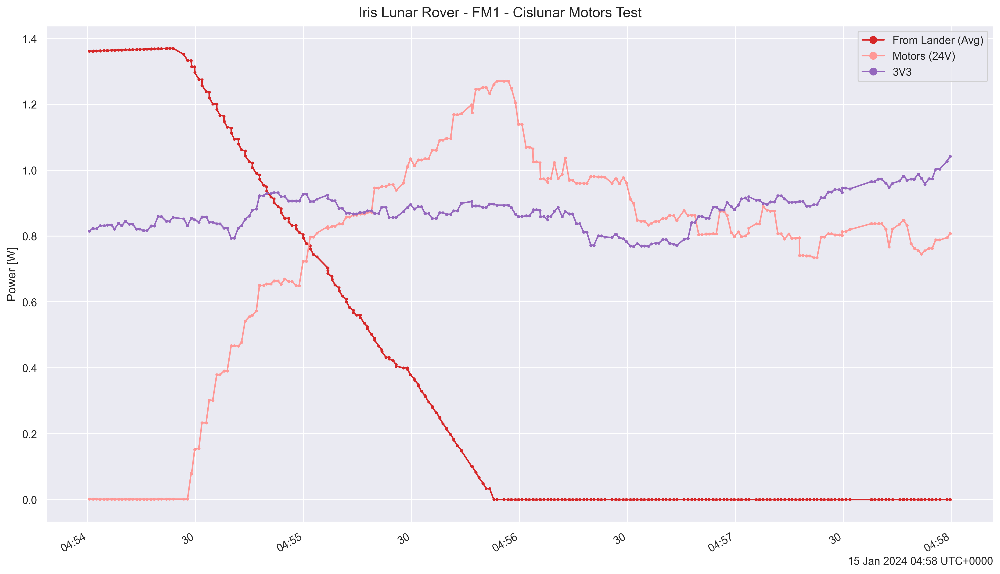

In [19]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_power(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Current Data

In [12]:
data.currents.dropna(axis=0, how='all', inplace=False).head(3)

,From Lander (Avg),Full-System (VSA),Motors (24V),3V3,3V3F,1V2F,3V3H,1V2H,3V3R
time (UTC),,,,,,,,,
2024-01-15 04:52:00.421000+00:00,NaN,NaN,0.321744,89.171929,-0.003,-0.003000,63.501232,199.689308,59.308355
2024-01-15 04:52:01.529000+00:00,NaN,NaN,0.289510,229.660330,-0.003,-0.003000,47.658008,207.425571,41.660004
2024-01-15 04:52:03.414000+00:00,NaN,NaN,0.192807,188.740509,-0.003,0.426792,45.697080,207.586744,39.054387


: 

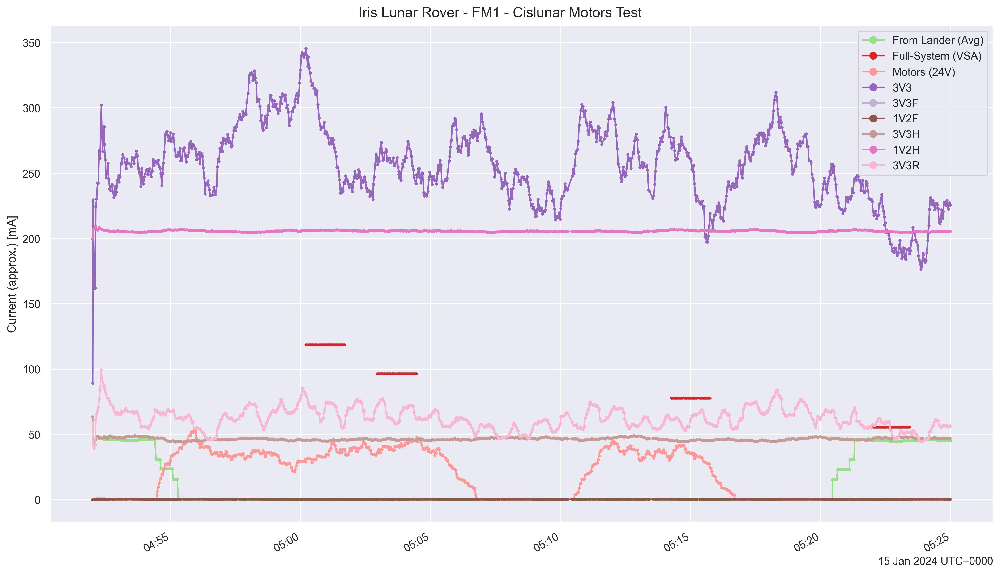

: 

In [13]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_currents(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Voltage Data

In [14]:
data.voltages.dropna(axis=0, how='all', inplace=False).head(3)

,Lander (28V),Heater,Battery (VBS),Full-System (VSA),Motor Bus (24V),2V8,2V5
time (UTC),,,,,,,
2024-01-15 04:52:00.570000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-15 04:52:01.563000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-15 04:52:02.430000+00:00,29.795815,NaN,NaN,NaN,NaN,NaN,NaN


: 

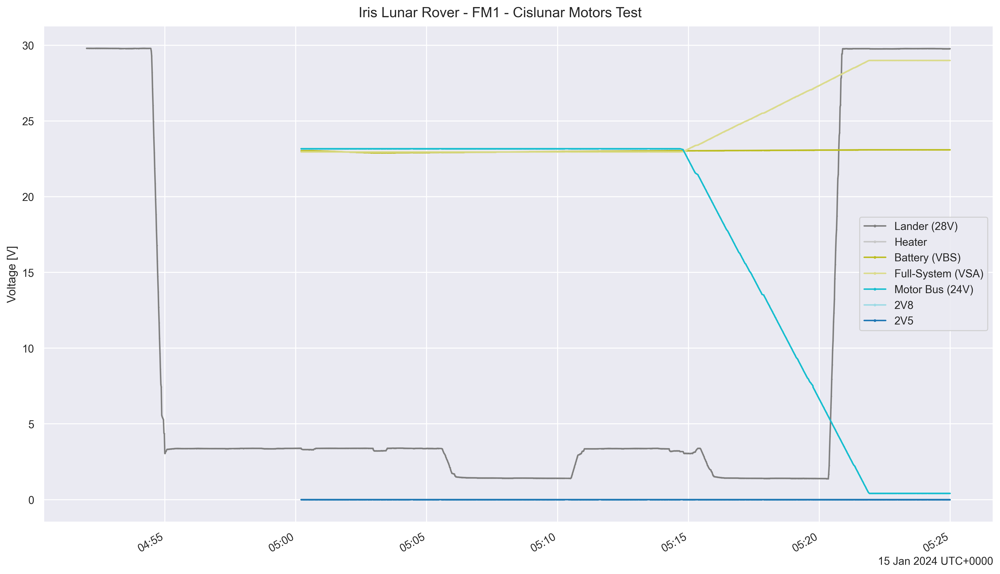

: 

In [15]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_voltages(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs)

## Battery Data

In [16]:
data.battery.dropna(axis=0, how='all', inplace=False).head(3)

,Charge Available [Ah],Energy Available [Wh],State of Charge [% Energy]
time (UTC),,,
2024-01-15 04:52:00.529000+00:00,2.349667,50.001698,0.648075
2024-01-15 04:52:04.416000+00:00,2.326314,49.504740,0.641634
2024-01-15 04:52:07.525000+00:00,2.318739,49.343537,0.639544


: 

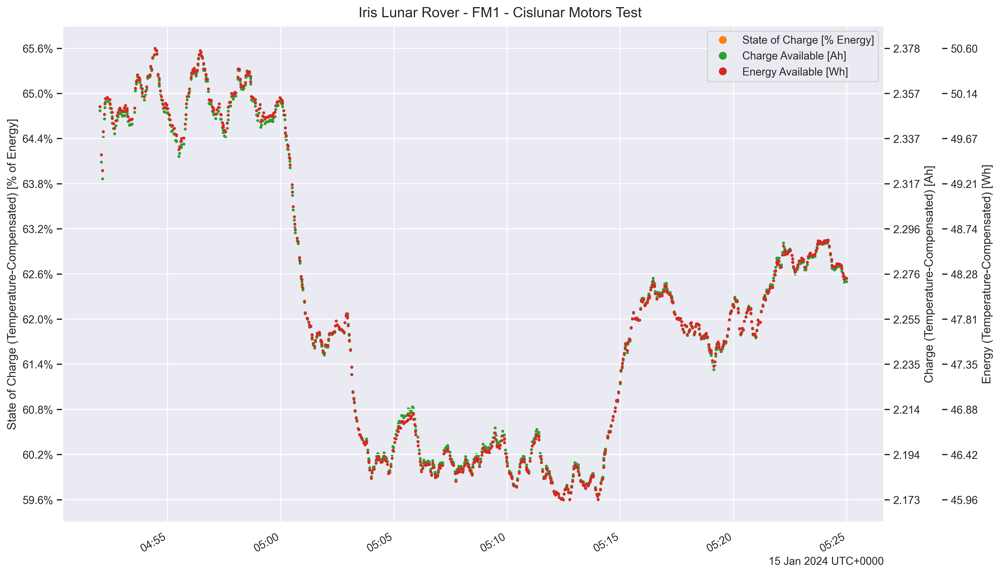

: 

In [17]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_battery(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## State Data

In [18]:
data.states.dropna(axis=0, how='all', inplace=False).head(3)

,Operational Circuit,Release Circuit,Wired Comms,Wireless Comms,Watchdog,Heating Control,Heater,Deployment,Battery,Charger,...,EN-3V3,HERC-ON,HERC-NPRST,HERC-NRST,WF121-ON,WF121-NRST,FPGA-ON,FPGA-NRST,CAM-SEL,Motor Bus
time (UTC),,,,,,,,,,,,,,,,,,,,,
2024-01-08 08:16:22.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-08 08:16:32.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-08 08:16:42.251000+00:00,None,None,INACTIVE,INACTIVE,None,None,None,None,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


: 

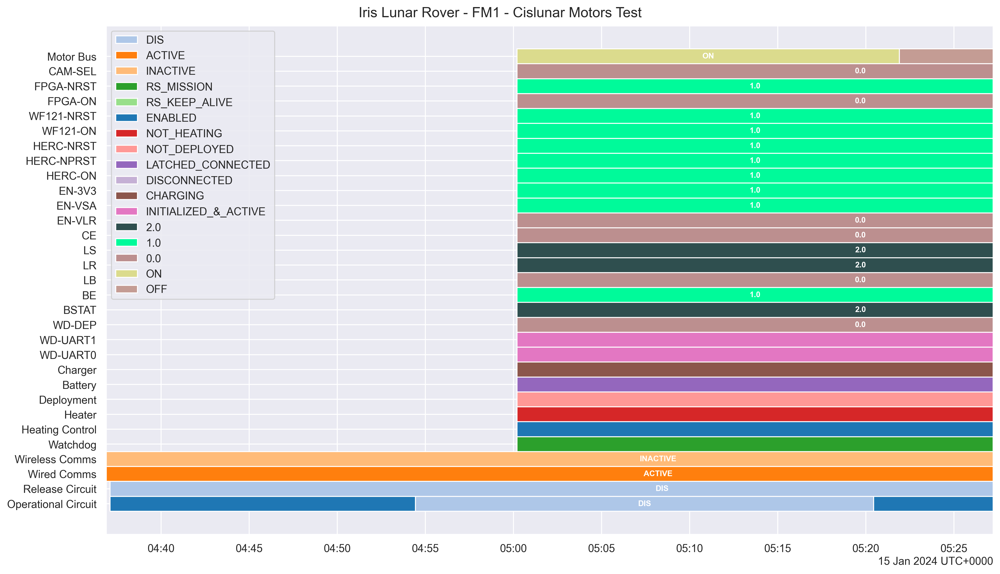

: 

In [19]:
cfg = PlotSettings(TITLE, dpi=300, start_time=START_TIME, end_time=END_TIME)
fig, axs = create_figure(cfg)
data.plot_states(
    cfg, axs, 0, fig,
    label_fit_factor=1.1, blank_interval=timedelta(minutes=15)
)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Data Data

In [20]:
data.ul_packets.dropna(axis=0, how='all', inplace=False).head(3)

,Uplinked Commands Received (GI),Uplinked Packets Received (GI),Packets Uplinked (GSW)
time (UTC),,,
2024-01-15 04:52:00.413000+00:00,NaN,NaN,213.0
2024-01-15 04:52:00.421000+00:00,NaN,NaN,213.0
2024-01-15 04:52:00.505000+00:00,NaN,NaN,213.0


: 

In [21]:
data.dl_packets.dropna(axis=0, how='all', inplace=False).head(3)

,Packets Downlinked (GI),Downlinked Packets Received (GSW)
time (UTC),,
2024-01-15 04:52:00.413000+00:00,NaN,63960.0
2024-01-15 04:52:00.421000+00:00,NaN,63961.0
2024-01-15 04:52:00.505000+00:00,NaN,63962.0


: 

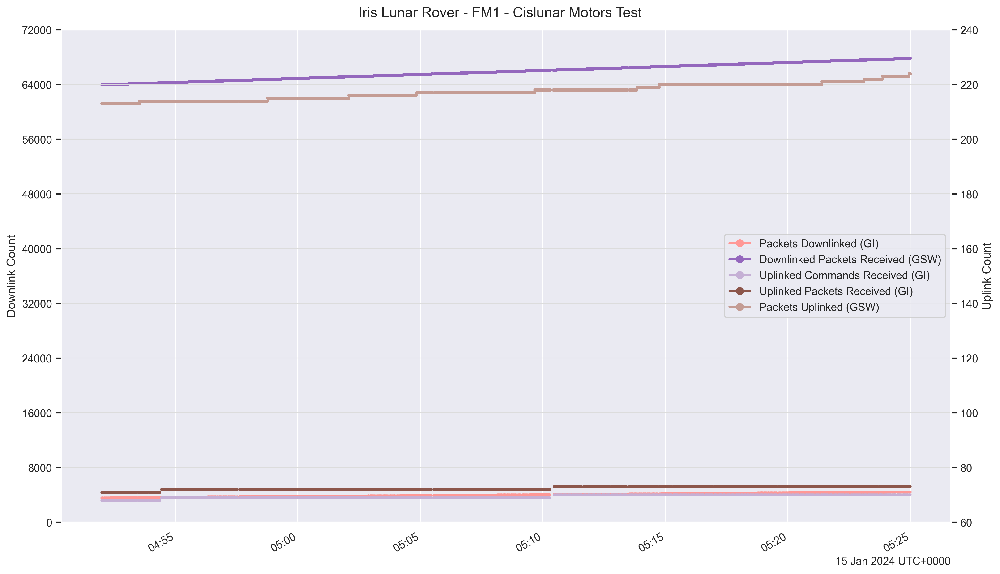

: 

In [22]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_packets(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

In [23]:
data.data.dropna(axis=0, how='all', inplace=False).head(3)

,Mission Data Volume (Bytes),"Mission Data Volume, w/Overhead Penalty (Bytes)"
time (UTC),,
2024-01-15 04:52:00.421000+00:00,8508460.0,9403914.0
2024-01-15 04:52:00.505000+00:00,8508506.0,9403974.0
2024-01-15 04:52:00.559000+00:00,8508523.0,9404005.0


: 

In [24]:
data.data_rate.dropna(axis=0, how='all', inplace=False).head(3)

,Avg. Data Rate,"Avg. Data Rate, w/Overhead Penalty"
time (UTC),,
2024-01-15 04:52:00.413000+00:00,2501.802221,2720.483086
2024-01-15 04:52:00.421000+00:00,2501.855105,2720.538963
2024-01-15 04:52:00.505000+00:00,2501.865082,2720.549289


: 

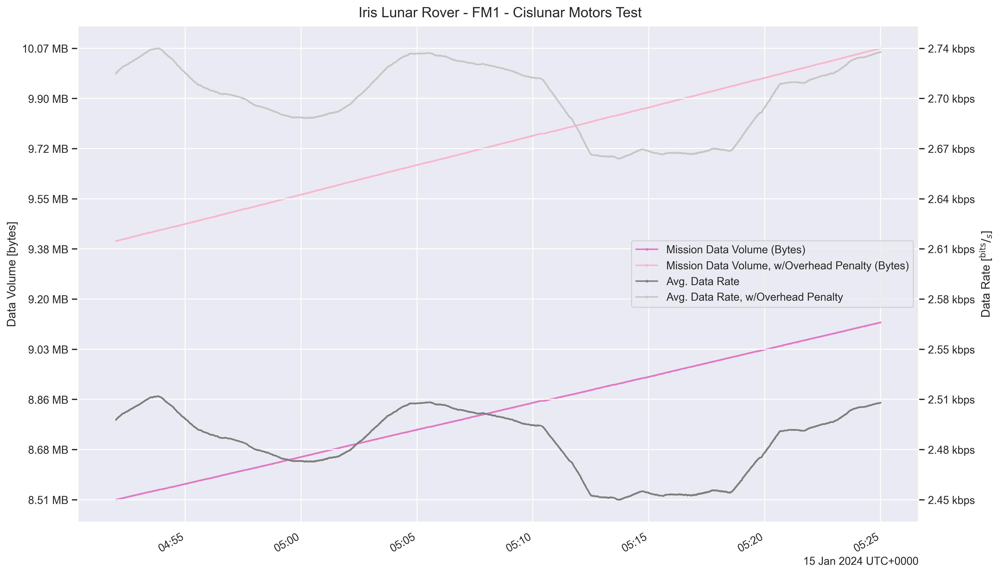

: 

In [25]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_data_fields(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Inertial Data

(111.1111115825213, 276.21921185278427, 1000.0000107102097)

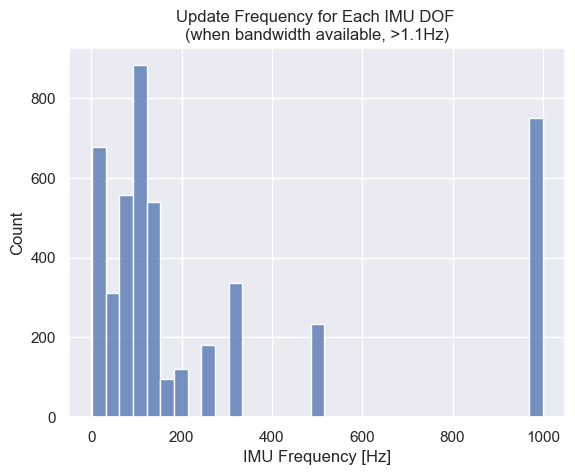

In [64]:
# IMU Data Rate:
# Grab only raw IMU data:
imu_raw = data.telem_full[['Imu_XAcc', 'Imu_YAcc', 'Imu_ZAcc', 'Imu_XAng', 'Imu_YAng', 'Imu_ZAng']]
# Since each column could telemeter seperately, collect update frequency for
# each sensor:
imu_freq_hz = np.zeros((0,))
for col in imu_raw.columns:
    imu_times = imu_raw[col].dropna().index
    imu_times_s = (imu_times - imu_times[0]).total_seconds()
    imu_periods_s = np.diff(imu_times_s.to_numpy())
    # Clean data & remove non-continuous intervals (i.e. LOS gap):
    imu_periods_s = imu_periods_s[imu_periods_s > 0]
    imu_periods_s = imu_periods_s[imu_periods_s < 0.9]  # Only consider sub-Hz rates (i.e. periods where IMU is actually getting allocation).
    imu_freq_hz = np.append(imu_freq_hz, 1/imu_periods_s, axis=0)

sns.histplot(imu_freq_hz)
plt.xlabel('IMU Frequency [Hz]')
plt.title("Update Frequency for Each IMU DOF \n(when bandwidth available, >1.1Hz)")
np.median(imu_freq_hz), imu_freq_hz.mean(), imu_freq_hz.max()

In [10]:
data.inertial.dropna(axis=0, how='all', inplace=False).head(3)

,Acceleration-X [$^{m}/_{s^2}$],Acceleration-Y [$^{m}/_{s^2}$],Acceleration-Z [$^{m}/_{s^2}$],Vector Magnitude [$^{m}/_{s^2}$]
time (UTC),,,,
2024-01-09 13:52:57.953000+00:00,-0.322782,0.0,0.161391,0.360881
2024-01-09 13:52:57.969000+00:00,-0.322782,0.0,0.161391,0.360881
2024-01-09 13:52:58.121000+00:00,-0.322782,0.0,0.161391,0.360881


In [27]:
data.angle.dropna(axis=0, how='all', inplace=False).head(3)

,Pitch Angle Est. [deg],Roll Angle Est. [deg]
time (UTC),,
2024-01-15 04:52:00.413000+00:00,5.490055,35.217593
2024-01-15 04:52:00.421000+00:00,3.218306,32.057396
2024-01-15 04:52:01.413000+00:00,1.021442,36.371598


: 

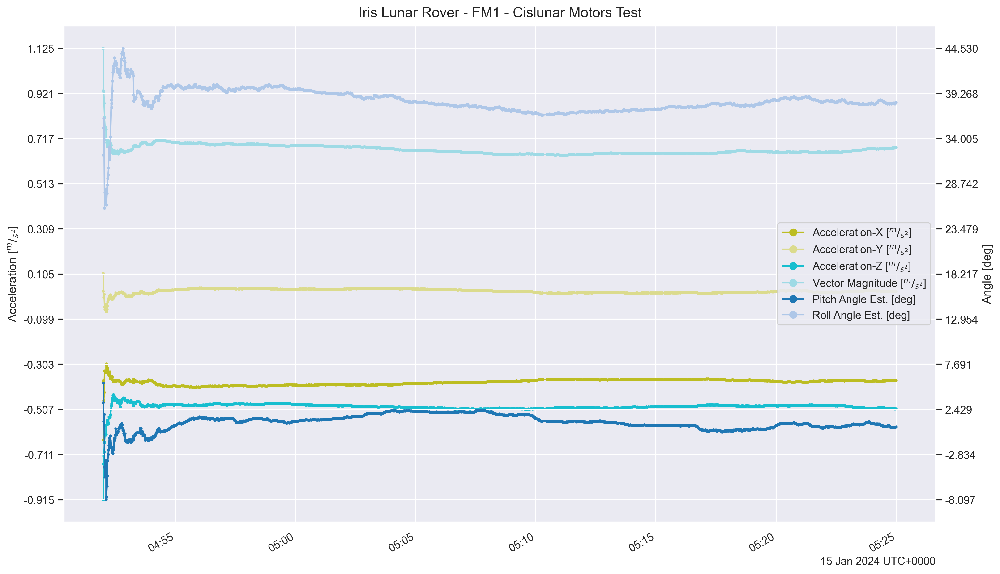

: 

In [28]:
cfg = PlotSettings(TITLE, dpi=300)
fig, axs = create_figure(cfg)
data.plot_inertial(cfg, axs, 0)
add_legends(cfg, axs)
tidy_figure(cfg, axs, skip_y_align=True)  # y is handled by plotter

## Battery Diode Leakage Plot

Connecting to Local DB for iTVAC data . . .
Loading iTVAC Telem . . .
Plotting iTVAC . . .
Plotting Mission Data . . .


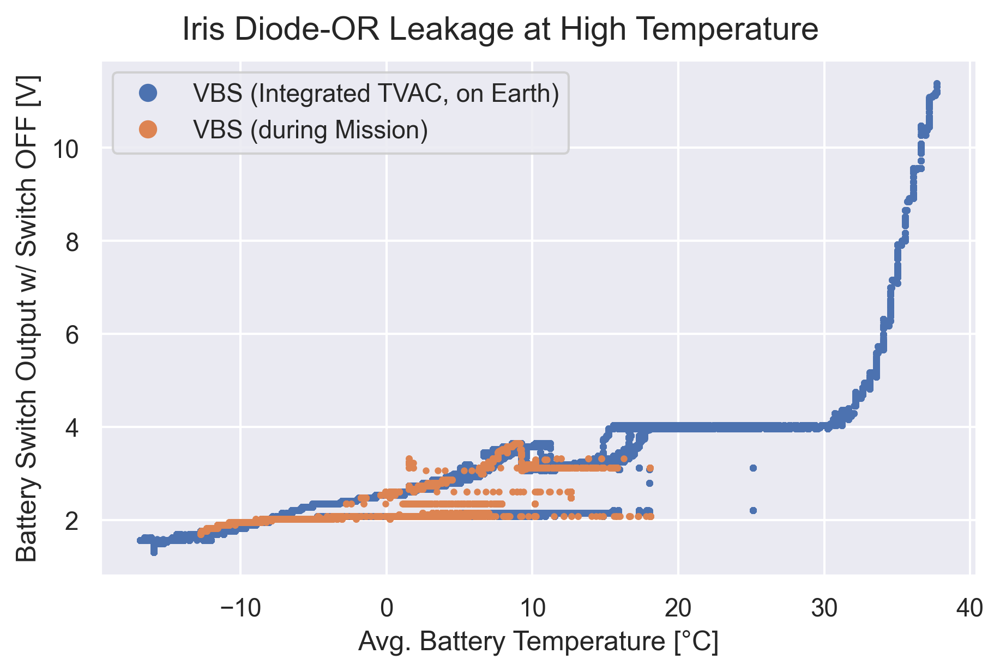

In [9]:
FIG_SIZE=(6,4)
# First plot iTVAC data:
# Grab external iTVAC data:
DB_DIR = './out/databases'
DB_FILE = 'int-tvac-data2.h5'
DB_PATH = os.path.join(DB_DIR, DB_FILE)
print("Connecting to Local DB for iTVAC data . . .")
itvac_db = pd.HDFStore(DB_PATH)
print("Loading iTVAC Telem . . .")
itvac_telem = DataSet._load_from_hdf('telem', itvac_db)
# Collect all Iris on-board RT temperture readings and VBS readings:
battRTCelsius = itvac_telem.data['WatchdogHeartbeat_BattAdcTempKelvin'] - 273.15
vbs = itvac_telem.data['WatchdogDetailedStatus_Adc_SwitchedBatteryVoltage']
batt_off = (
    itvac_telem.data['WatchdogDetailedStatus_Io_BatteryState'].ffill()\
        .isin([0.0, 'DISCONNECTED'])
)
itvac_db.close()

# Replot with external data:
print("Plotting iTVAC . . .")
cfg, fig, axs = make_diode_leakage_plot(
    data,
    FILES_TITLE,
    start_time=START_TIME,
    end_time=END_TIME,
    extra_label="(Integrated TVAC, on Earth)",
    external_curves=(battRTCelsius, vbs, batt_off),
    line_styles = dict(
        marker='o',
        markersize=2,
        linestyle='none'  # just scatter plot these so we know where data is
    ),
    figsize=FIG_SIZE
) or (None, None, None)

# Then Generate & Layer on Mission Diode Leakage plot:
print("Plotting Mission Data . . .")
cfg, fig, axs = make_diode_leakage_plot(
    data,
    FILES_TITLE,
    start_time=START_TIME,
    end_time=END_TIME,
    existing_figure=(fig, axs),
    extra_label="(during Mission)",
    line_styles = dict(
        marker='o',
        markersize=2,
        linestyle='none'  # just scatter plot these so we know where data is
    ),
    figsize=FIG_SIZE
) or (None, None, None)

# Layer on iTVAC Plot:
add_legends(cfg, axs)

## Create Combined Strip Plot

In [30]:
# Stack all plots and make them share a common X-axis:
SAVE_DONT_PLOT: bool = False

cfg, fig, axs = make_strip_chart(
    data,
    TITLE, FILES_TITLE,
    start_time=START_TIME,
    end_time=END_TIME,
    skip_empty_plots=True,
    plot_thermal = True,
    plot_voltages = True,
    plot_power = True,
    plot_currents = True,
    plot_battery = True,
    plot_states = True,
    plot_imu = True,
    plot_packets = True,
    plot_data = True
) or (None, None, None)

if SAVE_DONT_PLOT and fig is not None:
    save_figure(cfg, axs)

: 